# Individual Coding Assignment
## Miles Kim Parr

In this assignment, I want to expand the dataset that I was looking at to include Supervisorial District 5 as we are narrowing the scope of our work to just two districts instead of 5.

I also want to write the code to add in the parks data which we will need to compare with later.

In [1]:
# import the bread and the butter 
import pandas as pd
import geopandas as gpd 

In [2]:
# Add the Dataset of District 5, add CT20 as a string so I can fix it
District5 = pd.read_excel('Data/District5.xlsx',
    dtype =
    {
        'CT20':str,
    }
)
District5

,OBJECTID_12,Join_Count,TARGET_FID,CT20,LABEL,NAME,SUP_NAME,DIST_SUP,CITYNAME_ALF,NAME_1,JURISDICTION,AREA_NUM,AREA_NAME,Shape__Area,Shape__Length
0,22,1,22,104124,1041.24,5TH SUP. DISTRICT,5TH DISTRICT: KATHRYN BARGER,5,NaN,KAGEL / LOPEZ CANYONS,UNINCORPORATED AREA,3,San Fernando Valley Planning Area,6.579433e+06,14622.375950
1,25,2,25,104204,1042.04,5TH SUP. DISTRICT,5TH DISTRICT: KATHRYN BARGER,5,LOS ANGELES,KAGEL / LOPEZ CANYONS,INCORPORATED/UNINCORPORATED,3,San Fernando Valley Planning Area,3.912763e+06,11156.478010
2,1102,1,1102,300100,3001.00,5TH SUP. DISTRICT,5TH DISTRICT: KATHRYN BARGER,5,NaN,LA CRESCENTA - MONTROSE,UNINCORPORATED AREA,1,West San Gabriel Valley Planning Area,6.762583e+06,11523.542526
3,1103,1,1103,300200,3002.00,5TH SUP. DISTRICT,5TH DISTRICT: KATHRYN BARGER,5,NaN,LA CRESCENTA - MONTROSE,UNINCORPORATED AREA,3,West San Gabriel Valley Planning Area,2.865626e+06,8208.996045
4,1106,1,1106,300501,3005.01,5TH SUP. DISTRICT,5TH DISTRICT: KATHRYN BARGER,5,NaN,LA CRESCENTA - MONTROSE,UNINCORPORATED AREA,3,West San Gabriel Valley Planning Area,1.847789e+06,7553.876038
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
66,2453,1,2453,920338,9203.38,5TH SUP. DISTRICT,5TH DISTRICT: KATHRYN BARGER,5,NaN,SANTA CLARITA VALLEY,UNINCORPORATED AREA,2,Santa Clarita Valley Planning Area,5.481003e+06,12655.913179
67,2454,1,2454,920339,9203.39,5TH SUP. DISTRICT,5TH DISTRICT: KATHRYN BARGER,5,NaN,SANTA CLARITA VALLEY,UNINCORPORATED AREA,2,Santa Clarita Valley Planning Area,5.027563e+07,32338.296365
68,2459,3,2459,930400,9304.00,5TH SUP. DISTRICT,5TH DISTRICT: KATHRYN BARGER,5,NaN,ANTELOPE VALLEY,UNINCORPORATED AREA,1,Antelope Valley Planning Area,2.195480e+09,349050.813757
69,2462,1,2462,980003,9800.03,5TH SUP. DISTRICT,5TH DISTRICT: KATHRYN BARGER,5,NaN,ANTELOPE VALLEY,UNINCORPORATED AREA,1,Antelope Valley Planning Area,2.869854e+08,101175.574618


In [3]:
# Make a matching GEO_ID Column
District5['GEO_ID'] = '06' + '037' + District5['CT20']
District5.head()

,OBJECTID_12,Join_Count,TARGET_FID,CT20,LABEL,NAME,SUP_NAME,DIST_SUP,CITYNAME_ALF,NAME_1,JURISDICTION,AREA_NUM,AREA_NAME,Shape__Area,Shape__Length,GEO_ID
0,22,1,22,104124,1041.24,5TH SUP. DISTRICT,5TH DISTRICT: KATHRYN BARGER,5,NaN,KAGEL / LOPEZ CANYONS,UNINCORPORATED AREA,3,San Fernando Valley Planning Area,6.579433e+06,14622.375950,06037104124
1,25,2,25,104204,1042.04,5TH SUP. DISTRICT,5TH DISTRICT: KATHRYN BARGER,5,LOS ANGELES,KAGEL / LOPEZ CANYONS,INCORPORATED/UNINCORPORATED,3,San Fernando Valley Planning Area,3.912763e+06,11156.478010,06037104204
2,1102,1,1102,300100,3001.00,5TH SUP. DISTRICT,5TH DISTRICT: KATHRYN BARGER,5,NaN,LA CRESCENTA - MONTROSE,UNINCORPORATED AREA,1,West San Gabriel Valley Planning Area,6.762583e+06,11523.542526,06037300100
3,1103,1,1103,300200,3002.00,5TH SUP. DISTRICT,5TH DISTRICT: KATHRYN BARGER,5,NaN,LA CRESCENTA - MONTROSE,UNINCORPORATED AREA,3,West San Gabriel Valley Planning Area,2.865626e+06,8208.996045,06037300200
4,1106,1,1106,300501,3005.01,5TH SUP. DISTRICT,5TH DISTRICT: KATHRYN BARGER,5,NaN,LA CRESCENTA - MONTROSE,UNINCORPORATED AREA,3,West San Gabriel Valley Planning Area,1.847789e+06,7553.876038,06037300501


In [4]:
# Now copy all of my old code for matching up the Census tracts. This will be easy because I accidentally downloaded the whole state census data last time. 
# I am not doing anything new here, just the same processes for District 5
Income5 = pd.read_excel(
    'Data/Income-Data.xlsx',
    dtype=
    {
        'GEO_ID':str,
    }
)
Income5 = Income5.drop([0])
Income5

,Geometry,GEO_ID,Less_10k,10k_to_14999,15k_to_19999,20k_24999,25k_to_29999,30k_34999,35k_39999,40k_to_44999,45k_to_49999,50k_to_59999,60k_to_74999,75k_to_99999,100k_to_124999,125k_to_149999,150k_to_199999,200k_plus
1,1400000U,06037101110,54,126,49,33,61,6,60,85,43,149,105,146,210,134,143,90
2,1400000U,06037101122,88,0,7,42,50,36,0,13,0,37,200,158,126,194,168,253
3,1400000U,06037101220,78,82,28,102,7,86,43,55,36,189,89,134,116,60,140,112
4,1400000U,06037101221,76,107,118,148,0,81,111,27,97,112,32,193,207,33,108,0
5,1400000U,06037101222,161,167,34,41,19,116,0,86,14,35,44,96,9,81,0,32
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2494,1400000U,06037980038,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
2495,1400000U,06037980039,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
2496,1400000U,06037990100,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
2497,1400000U,06037990200,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0


In [5]:
# Merge 
District5_Income=District5.merge(Income5,on="GEO_ID")
District5_Income

,OBJECTID_12,Join_Count,TARGET_FID,CT20,LABEL,NAME,SUP_NAME,DIST_SUP,CITYNAME_ALF,NAME_1,...,35k_39999,40k_to_44999,45k_to_49999,50k_to_59999,60k_to_74999,75k_to_99999,100k_to_124999,125k_to_149999,150k_to_199999,200k_plus
0,22,1,22,104124,1041.24,5TH SUP. DISTRICT,5TH DISTRICT: KATHRYN BARGER,5,NaN,KAGEL / LOPEZ CANYONS,...,40,32,12,67,115,170,121,78,135,80
1,25,2,25,104204,1042.04,5TH SUP. DISTRICT,5TH DISTRICT: KATHRYN BARGER,5,LOS ANGELES,KAGEL / LOPEZ CANYONS,...,34,47,13,46,48,131,74,31,56,44
2,1102,1,1102,300100,3001.00,5TH SUP. DISTRICT,5TH DISTRICT: KATHRYN BARGER,5,NaN,LA CRESCENTA - MONTROSE,...,0,15,61,15,187,84,334,191,447,636
3,1103,1,1103,300200,3002.00,5TH SUP. DISTRICT,5TH DISTRICT: KATHRYN BARGER,5,NaN,LA CRESCENTA - MONTROSE,...,58,49,53,91,41,151,95,122,209,573
4,1106,1,1106,300501,3005.01,5TH SUP. DISTRICT,5TH DISTRICT: KATHRYN BARGER,5,NaN,LA CRESCENTA - MONTROSE,...,81,21,0,105,97,74,88,150,114,180
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
66,2453,1,2453,920338,9203.38,5TH SUP. DISTRICT,5TH DISTRICT: KATHRYN BARGER,5,NaN,SANTA CLARITA VALLEY,...,0,7,29,49,64,106,185,200,332,605
67,2454,1,2454,920339,9203.39,5TH SUP. DISTRICT,5TH DISTRICT: KATHRYN BARGER,5,NaN,SANTA CLARITA VALLEY,...,11,50,81,101,191,160,325,248,319,950
68,2459,3,2459,930400,9304.00,5TH SUP. DISTRICT,5TH DISTRICT: KATHRYN BARGER,5,NaN,ANTELOPE VALLEY,...,16,3,14,36,14,38,33,18,51,63
69,2462,1,2462,980003,9800.03,5TH SUP. DISTRICT,5TH DISTRICT: KATHRYN BARGER,5,NaN,ANTELOPE VALLEY,...,0,0,0,0,0,0,0,0,0,0


In [6]:
Tracts5 = gpd.read_file('Data/tl_2021_06_tract.zip')

Tracts51 = Tracts5[['GEOID','geometry']]
Tracts51.columns = ['GEO_ID',
'geometry']
Tracts51.head()

ERROR 1: PROJ: proj_create_from_database: Open of /opt/conda/share/proj failed


,GEO_ID,geometry
0,06085504321,"POLYGON ((-121.87556 37.39924, -121.87535 37.3..."
1,06085504410,"POLYGON ((-121.88886 37.40758, -121.88576 37.4..."
2,06085507003,"POLYGON ((-122.02489 37.21683, -122.02459 37.2..."
3,06085507004,"POLYGON ((-121.99304 37.22562, -121.99249 37.2..."
4,06085502204,"POLYGON ((-121.93167 37.29803, -121.92801 37.3..."


In [7]:
Tracts_District5=Tracts51.merge(District5_Income,on="GEO_ID")
Tracts_District5

,GEO_ID,geometry,OBJECTID_12,Join_Count,TARGET_FID,CT20,LABEL,NAME,SUP_NAME,DIST_SUP,...,35k_39999,40k_to_44999,45k_to_49999,50k_to_59999,60k_to_74999,75k_to_99999,100k_to_124999,125k_to_149999,150k_to_199999,200k_plus
0,06037300200,"POLYGON ((-118.24864 34.23324, -118.24863 34.2...",1103,1,1103,300200,3002.00,5TH SUP. DISTRICT,5TH DISTRICT: KATHRYN BARGER,5,...,58,49,53,91,41,151,95,122,209,573
1,06037910709,"POLYGON ((-118.08253 34.53795, -118.08242 34.5...",2381,1,2381,910709,9107.09,5TH SUP. DISTRICT,5TH DISTRICT: KATHRYN BARGER,5,...,5,5,12,31,66,41,68,37,56,66
2,06037910810,"POLYGON ((-118.39335 34.43707, -118.39335 34.4...",2396,1,2396,910810,9108.10,5TH SUP. DISTRICT,5TH DISTRICT: KATHRYN BARGER,5,...,13,19,8,8,61,94,41,64,142,236
3,06037920104,"POLYGON ((-118.82074 34.66581, -118.82057 34.6...",2427,1,2427,920104,9201.04,5TH SUP. DISTRICT,5TH DISTRICT: KATHRYN BARGER,5,...,5,4,45,24,74,52,114,67,180,208
4,06037920303,"POLYGON ((-118.67056 34.36069, -118.67033 34.3...",2441,2,2441,920303,9203.03,5TH SUP. DISTRICT,5TH DISTRICT: KATHRYN BARGER,5,...,15,30,9,0,72,61,94,44,45,185
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
66,06037431502,"POLYGON ((-118.03081 34.10732, -118.03075 34.1...",1410,2,1410,431502,4315.02,5TH SUP. DISTRICT,5TH DISTRICT: KATHRYN BARGER,5,...,60,47,29,110,140,125,68,157,86,281
67,06037480011,"POLYGON ((-118.08259 34.12639, -118.08259 34.1...",1507,1,1507,480011,4800.11,5TH SUP. DISTRICT,5TH DISTRICT: KATHRYN BARGER,5,...,58,142,91,62,75,177,208,123,210,142
68,06037920102,"POLYGON ((-118.79895 34.72651, -118.79892 34.7...",2426,1,2426,920102,9201.02,5TH SUP. DISTRICT,5TH DISTRICT: KATHRYN BARGER,5,...,116,30,34,96,70,188,300,84,109,179
69,06037300100,"POLYGON ((-118.24859 34.23881, -118.24858 34.2...",1102,1,1102,300100,3001.00,5TH SUP. DISTRICT,5TH DISTRICT: KATHRYN BARGER,5,...,0,15,61,15,187,84,334,191,447,636


<Axes: >

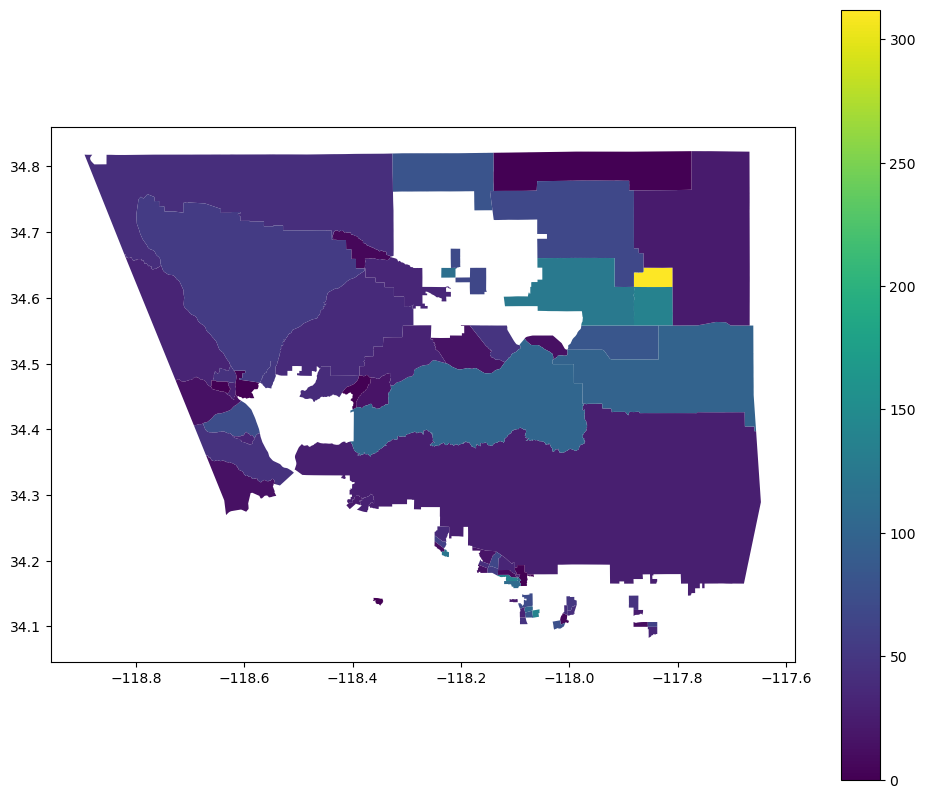

In [8]:
Tracts_District5.plot(figsize=(12,10),
                 column='Less_10k',
                 legend=True, 
                 )

In [9]:
NoCar = pd.read_excel('Data/VehicleOwnership.xlsx',
 dtype =
    {
        'GEO_ID':str,
    }
)
NoCar.info(verbose=True, show_counts=True)

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 29936 entries, 0 to 29935
Data columns (total 4 columns):
 #   Column                  Non-Null Count  Dtype  
---  ------                  --------------  -----  
 0   GEO_ID                  29936 non-null  object 
 1   denom_occupied_housing  29749 non-null  float64
 2   no_vehicle_count        29749 non-null  float64
 3   no_vehicle_pct          29695 non-null  float64
dtypes: float64(3), object(1)
memory usage: 935.6+ KB


In [10]:
NoCar['GEO_ID'] = '0' + NoCar['GEO_ID']
NoCar.head()
# I didn't know if that would work. Looks like it did

,GEO_ID,denom_occupied_housing,no_vehicle_count,no_vehicle_pct
0,06037101110,1494.0,192.0,12.851406
1,06037101122,1372.0,9.0,0.655977
2,06037101220,1357.0,73.0,5.379514
3,06037101221,1450.0,215.0,14.827586
4,06037101222,935.0,196.0,20.962566


In [11]:
Frankie5=Tracts_District5.merge(NoCar,on="GEO_ID")
Frankie5

,GEO_ID,geometry,OBJECTID_12,Join_Count,TARGET_FID,CT20,LABEL,NAME,SUP_NAME,DIST_SUP,...,50k_to_59999,60k_to_74999,75k_to_99999,100k_to_124999,125k_to_149999,150k_to_199999,200k_plus,denom_occupied_housing,no_vehicle_count,no_vehicle_pct
0,06037300200,"POLYGON ((-118.24864 34.23324, -118.24863 34.2...",1103,1,1103,300200,3002.00,5TH SUP. DISTRICT,5TH DISTRICT: KATHRYN BARGER,5,...,91,41,151,95,122,209,573,1827.0,154.0,8.429119
1,06037300200,"POLYGON ((-118.24864 34.23324, -118.24863 34.2...",1103,1,1103,300200,3002.00,5TH SUP. DISTRICT,5TH DISTRICT: KATHRYN BARGER,5,...,91,41,151,95,122,209,573,1853.0,83.0,4.479223
2,06037300200,"POLYGON ((-118.24864 34.23324, -118.24863 34.2...",1103,1,1103,300200,3002.00,5TH SUP. DISTRICT,5TH DISTRICT: KATHRYN BARGER,5,...,91,41,151,95,122,209,573,1876.0,56.0,2.985075
3,06037300200,"POLYGON ((-118.24864 34.23324, -118.24863 34.2...",1103,1,1103,300200,3002.00,5TH SUP. DISTRICT,5TH DISTRICT: KATHRYN BARGER,5,...,91,41,151,95,122,209,573,1867.0,87.0,4.659882
4,06037300200,"POLYGON ((-118.24864 34.23324, -118.24863 34.2...",1103,1,1103,300200,3002.00,5TH SUP. DISTRICT,5TH DISTRICT: KATHRYN BARGER,5,...,91,41,151,95,122,209,573,1919.0,109.0,5.680042
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
847,06037300501,"POLYGON ((-118.24875 34.22250, -118.24875 34.2...",1106,1,1106,300501,3005.01,5TH SUP. DISTRICT,5TH DISTRICT: KATHRYN BARGER,5,...,105,97,74,88,150,114,180,960.0,27.0,2.812500
848,06037300501,"POLYGON ((-118.24875 34.22250, -118.24875 34.2...",1106,1,1106,300501,3005.01,5TH SUP. DISTRICT,5TH DISTRICT: KATHRYN BARGER,5,...,105,97,74,88,150,114,180,970.0,29.0,2.989691
849,06037300501,"POLYGON ((-118.24875 34.22250, -118.24875 34.2...",1106,1,1106,300501,3005.01,5TH SUP. DISTRICT,5TH DISTRICT: KATHRYN BARGER,5,...,105,97,74,88,150,114,180,1217.0,22.0,1.807724
850,06037300501,"POLYGON ((-118.24875 34.22250, -118.24875 34.2...",1106,1,1106,300501,3005.01,5TH SUP. DISTRICT,5TH DISTRICT: KATHRYN BARGER,5,...,105,97,74,88,150,114,180,1193.0,23.0,1.927913


In [12]:
import folium

In [13]:
N5 = folium.Map(location=[34.364162, -118.280312],
               zoom_start = 9, 
               tiles='CartoDB positron', 
               attribution='CartoDB')

folium.Choropleth(
                  geo_data=Frankie5, 
                  data=Frankie5,          
                  key_on='feature.properties.GEO_ID', 
                  columns=['GEO_ID', 'no_vehicle_pct'], 
                  fill_color='YlGnBu',
                  line_weight=0.1, 
                  fill_opacity=0.8,
                  line_opacity=0.2,
                  legend_name='No Vehicle Household by Percent').add_to(N5)
N5

In [14]:
# Idk what the black regions are on the map

In [15]:
# I want to try ploting the Parks layer onto this map 
Parks = gpd.read_file('Data/Parks.zip')
Parks

,address,name,objectid,geometry
0,3400 Wilshire blvd,Robert F Kennedy Inspiration Park,1.0,"POLYGON ((-118.29796 34.06162, -118.29697 34.0..."
1,4702 N. Figueroa St,SYCAMORE GROVE PARK,2.0,"MULTIPOLYGON (((-118.20110 34.10134, -118.2011..."
2,351 N. Gaffey St.,San Pedro Welcome Park,3.0,"POLYGON ((-118.29286 33.74600, -118.29286 33.7..."
3,1015 S.Wilton PL,WILTON PLACE PARK,4.0,"POLYGON ((-118.31504 34.05232, -118.31497 34.0..."
4,1780 E.Santa Ana Blvd,WATTS CULTURAL CRESCENT,5.0,"POLYGON ((-118.24221 33.93945, -118.24225 33.9..."
...,...,...,...,...
505,"4501 S. CENTRAL AVE, LA, CA 90011",VERNON BRANCH LIBRARY POCKET PARK,508.0,"POLYGON ((-118.25661 34.00268, -118.25661 34.0..."
506,"4948-4956 YORK BLVD,LA,CA 90042",YORK BLVD POCKET PARK,509.0,"POLYGON ((-118.20707 34.12131, -118.20714 34.1..."
507,1010 W. 25th St,HOOVER RECREATION CENTER,510.0,"MULTIPOLYGON (((-118.28359 34.03293, -118.2835..."
508,5340 Canoga Avenue,OLD FIRE STATION 84 POCKET PARK,511.0,"POLYGON ((-118.59692 34.16705, -118.59697 34.1..."


In [16]:
Parks.crs
# In order to plot they need to be in matching Coordinate Reference Systems

<Geographic 2D CRS: GEOGCS["WGS84(DD)",DATUM["WGS84",SPHEROID["WGS84", ...>
Name: WGS84(DD)
Axis Info [ellipsoidal]:
- lon[east]: Longitude (degree)
- lat[north]: Latitude (degree)
Area of Use:
- undefined
Datum: WGS84
- Ellipsoid: WGS84
- Prime Meridian: Greenwich

In [17]:
Frankie5.crs
# They are in different ones

<Geographic 2D CRS: EPSG:4269>
Name: NAD83
Axis Info [ellipsoidal]:
- Lat[north]: Geodetic latitude (degree)
- Lon[east]: Geodetic longitude (degree)
Area of Use:
- name: North America - onshore and offshore: Canada - Alberta; British Columbia; Manitoba; New Brunswick; Newfoundland and Labrador; Northwest Territories; Nova Scotia; Nunavut; Ontario; Prince Edward Island; Quebec; Saskatchewan; Yukon. Puerto Rico. United States (USA) - Alabama; Alaska; Arizona; Arkansas; California; Colorado; Connecticut; Delaware; Florida; Georgia; Hawaii; Idaho; Illinois; Indiana; Iowa; Kansas; Kentucky; Louisiana; Maine; Maryland; Massachusetts; Michigan; Minnesota; Mississippi; Missouri; Montana; Nebraska; Nevada; New Hampshire; New Jersey; New Mexico; New York; North Carolina; North Dakota; Ohio; Oklahoma; Oregon; Pennsylvania; Rhode Island; South Carolina; South Dakota; Tennessee; Texas; Utah; Vermont; Virginia; Washington; West Virginia; Wisconsin; Wyoming. US Virgin Islands. British Virgin Islands

In [18]:
Parks1 = Parks.to_crs(epsg=4269)
Parks1.crs

<Geographic 2D CRS: EPSG:4269>
Name: NAD83
Axis Info [ellipsoidal]:
- Lat[north]: Geodetic latitude (degree)
- Lon[east]: Geodetic longitude (degree)
Area of Use:
- name: North America - onshore and offshore: Canada - Alberta; British Columbia; Manitoba; New Brunswick; Newfoundland and Labrador; Northwest Territories; Nova Scotia; Nunavut; Ontario; Prince Edward Island; Quebec; Saskatchewan; Yukon. Puerto Rico. United States (USA) - Alabama; Alaska; Arizona; Arkansas; California; Colorado; Connecticut; Delaware; Florida; Georgia; Hawaii; Idaho; Illinois; Indiana; Iowa; Kansas; Kentucky; Louisiana; Maine; Maryland; Massachusetts; Michigan; Minnesota; Mississippi; Missouri; Montana; Nebraska; Nevada; New Hampshire; New Jersey; New Mexico; New York; North Carolina; North Dakota; Ohio; Oklahoma; Oregon; Pennsylvania; Rhode Island; South Carolina; South Dakota; Tennessee; Texas; Utah; Vermont; Virginia; Washington; West Virginia; Wisconsin; Wyoming. US Virgin Islands. British Virgin Islands

In [19]:
import matplotlib.pyplot as plt

<Axes: >

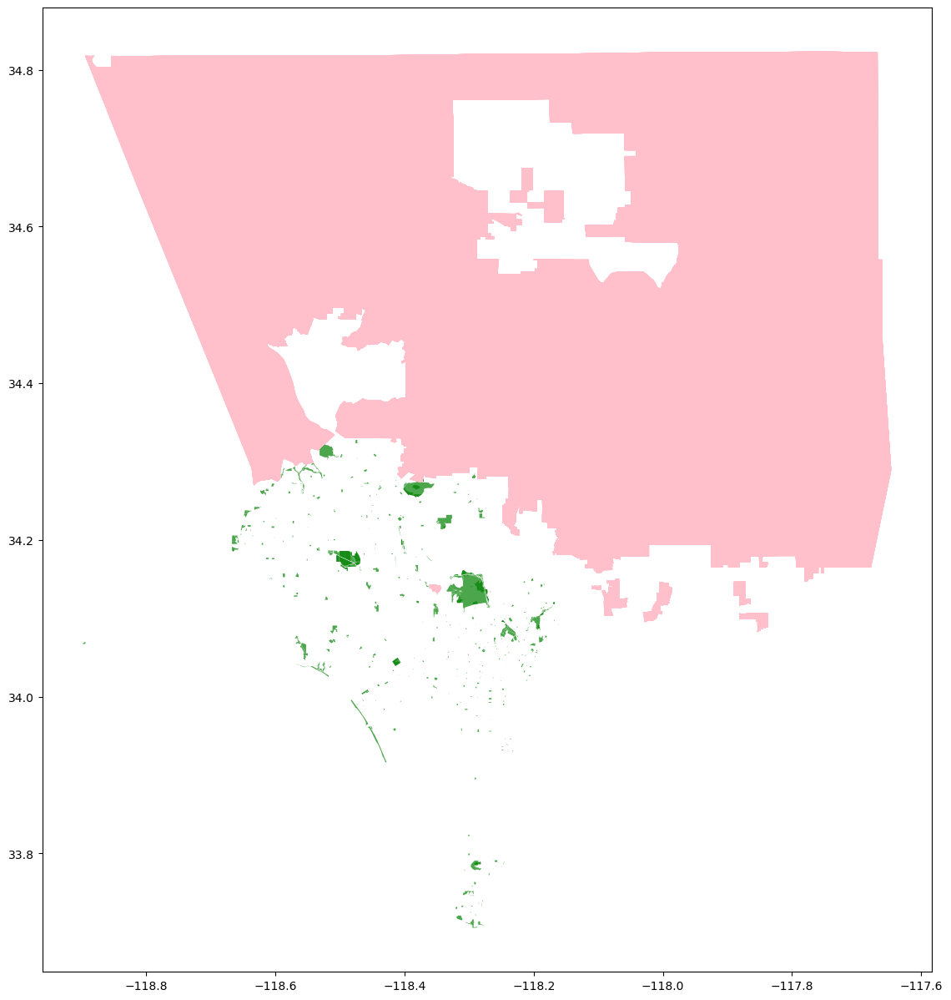

In [23]:
fig, ax = plt.subplots (figsize = (15,15))
Parks1.plot(ax = ax, alpha = 0.7, color = "green")
Frankie5.plot(ax = ax, color = "pink")

In [25]:
Frankie5.append("Parks1")

AttributeError: 'GeoDataFrame' object has no attribute 'append'

In [21]:
N6 = folium.Map(location=[34.364162, -118.280312],
               zoom_start = 9, 
               tiles='CartoDB positron', 
               attribution='CartoDB')

folium.Choropleth(
                  geo_data=Parks_Clipped, 
                  data=Parks_Clipped,          
                  key_on='feature.properties.GEO_ID', 
                  columns=['GEO_ID', 'no_vehicle_pct'], 
                  fill_color='YlGnBu',
                  line_weight=0.1, 
                  fill_opacity=0.8,
                  line_opacity=0.2,
                  legend_name='No Vehicle Household by Percent w/ Parks').add_to(N6)
N6

NameError: name 'Parks_Clipped' is not defined